In [1]:
import os

from pickupnet.models import PickupNet
from PIL import Image

In [2]:
model = PickupNet()
model.prepare() 

Using cache: ./tmp/misc-internal.ap-northeast-1/sanjo/PickupNet/model/v2/model


In [3]:
folder_path = '/Users/oisin-brogan/Downloads/samples from cookpad th/'
sub_folders = [fldr for fldr in os.listdir(folder_path) if os.path.isdir(folder_path+fldr)]

In [4]:
sub_folders

['banana',
 'chicken',
 'curry mushroom',
 'microwave',
 'pasta',
 'pork',
 'pork ribs',
 'sandwich',
 'Thai dessert top 10',
 'Yum noodle top 10']

In [5]:
scores_dict = {}

In [6]:
for sub_folder in sub_folders:
    images = [fi for fi in os.listdir(folder_path+sub_folder) if fi.endswith('.jpg')]
    
    scores = []
    for img in images:
        score = model.infer(Image.open(folder_path + sub_folder + '/'+ img))
        scores.append(score)
    
    scores_dict[sub_folder] = list(zip(images, scores))

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline  
from IPython.core.display import display, HTML

def display_subfolder(subfolder):
    image_scores = scores_dict[subfolder]
    
    #display(HTML('{} score={:.2f}'.format(photo, score) ))
    fig = plt.figure(figsize=(17, 10))
    for index, img_score in enumerate(image_scores):
        img, score = img_score
        if index < 5:
            a=fig.add_subplot((index/5)+2, len(image_scores)/2, index + 1)
        else:
            a=fig.add_subplot((index/5)+2, len(image_scores)/2, index +5+ 1)
        a.set_title('{:.2f}'.format(score))
        plt.imshow(Image.open(folder_path + subfolder+'/'+img))
        plt.axis('off')
    plt.show()
#   display(HTML('<hr>'))

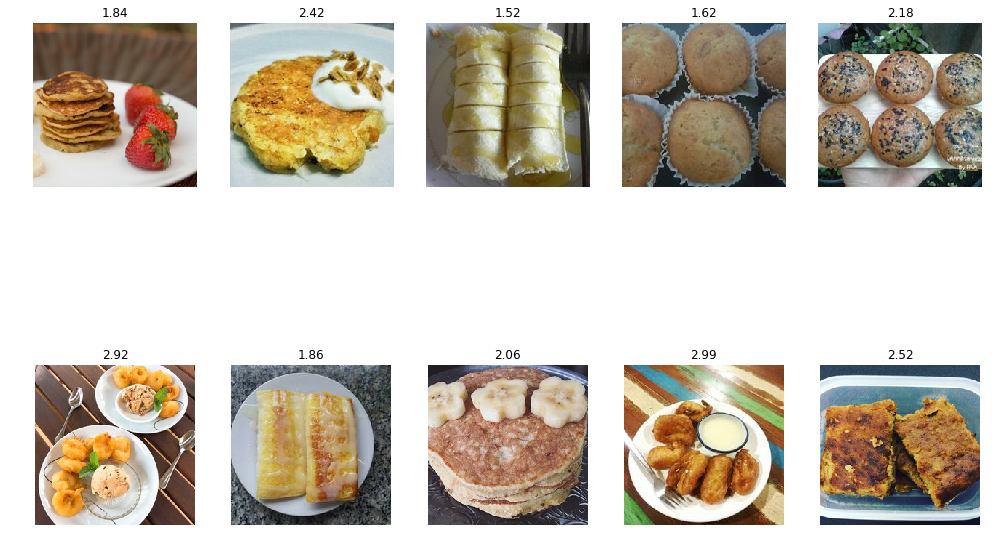

In [8]:
display_subfolder('banana')

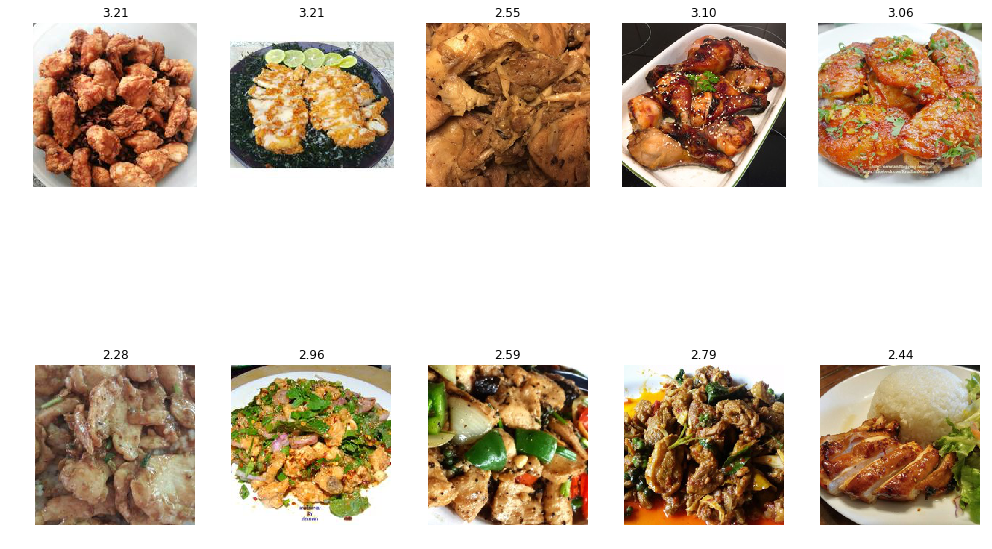

In [9]:
display_subfolder('chicken')

ValueError: num must be 1 <= num <= 12, not 13

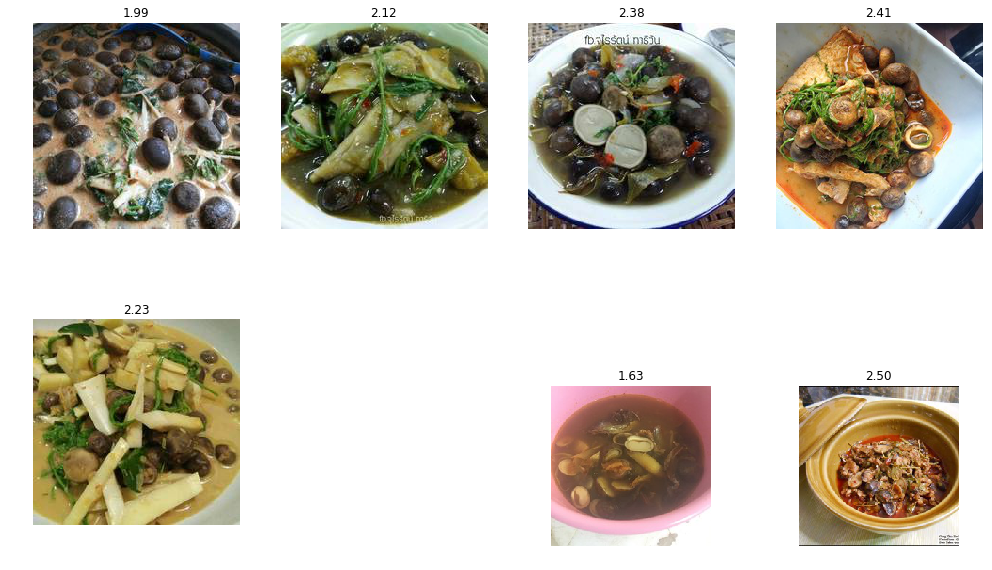

In [10]:
display_subfolder('curry mushroom')

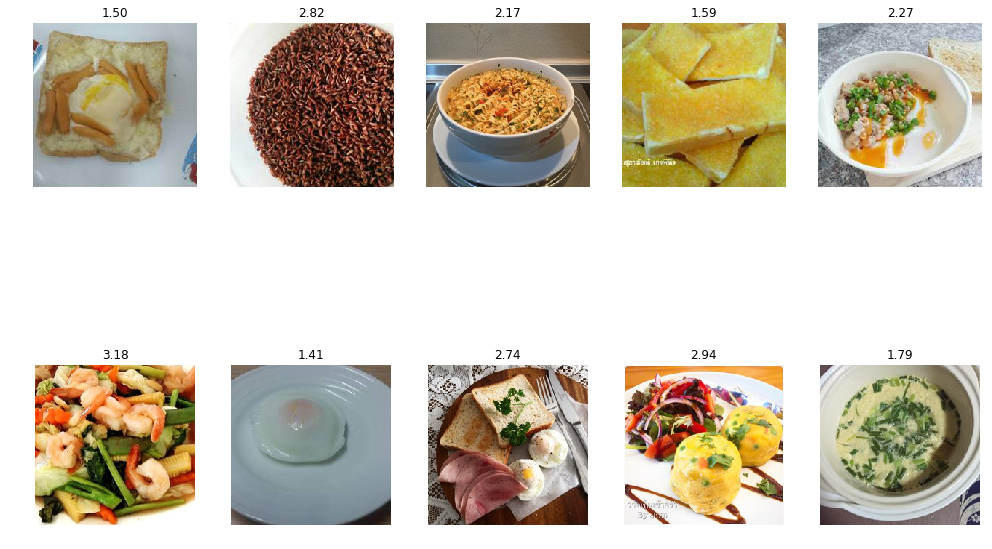

In [11]:
display_subfolder('microwave')

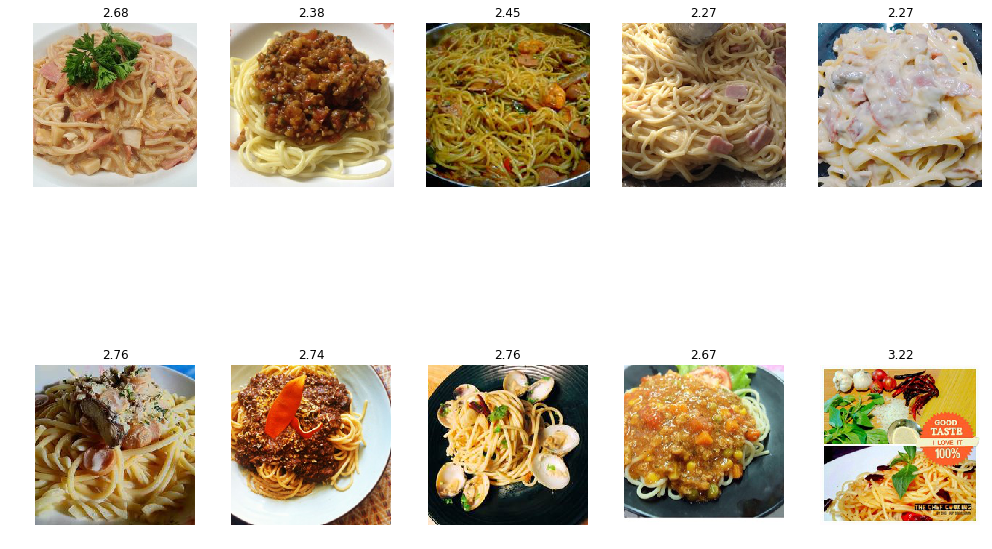

In [12]:
display_subfolder('pasta')

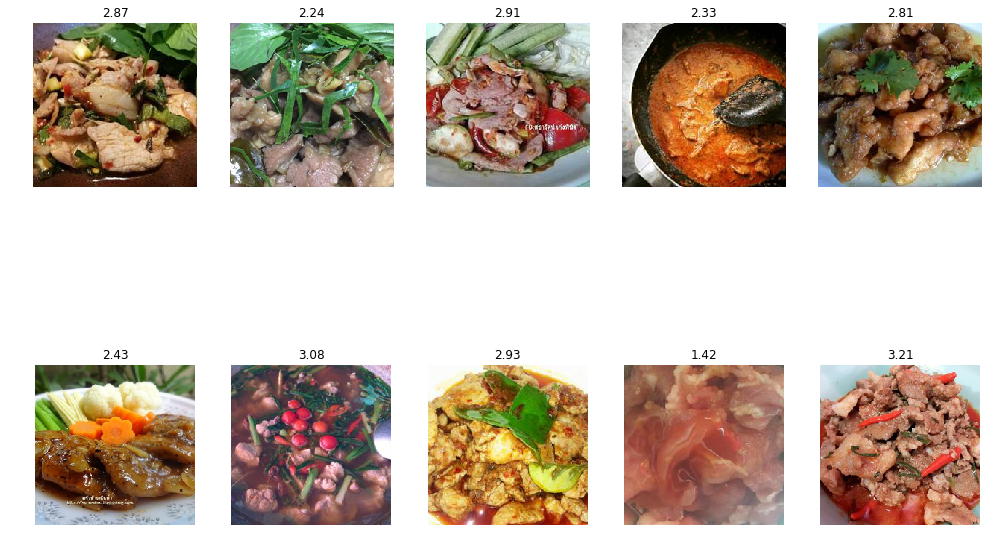

In [13]:
display_subfolder('pork')

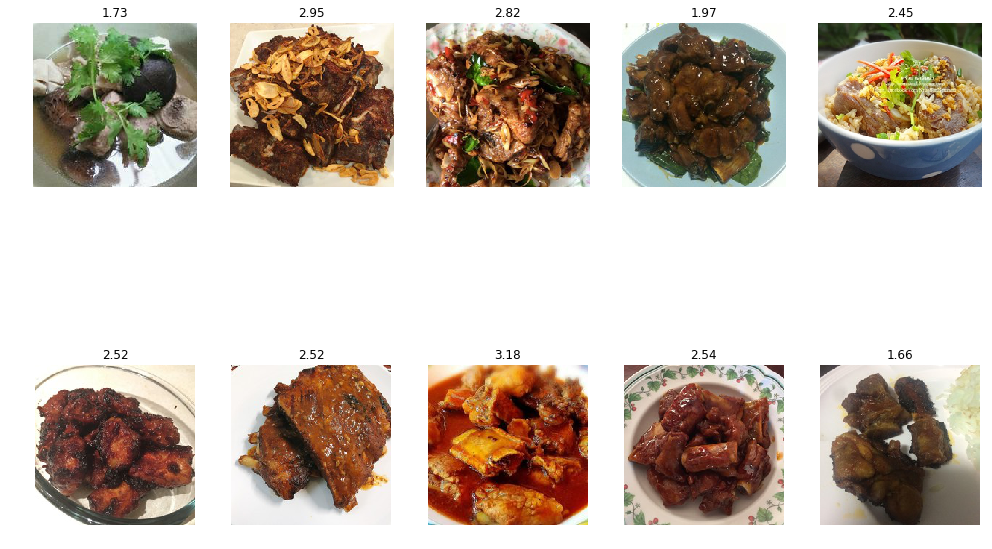

In [14]:
display_subfolder('pork ribs')

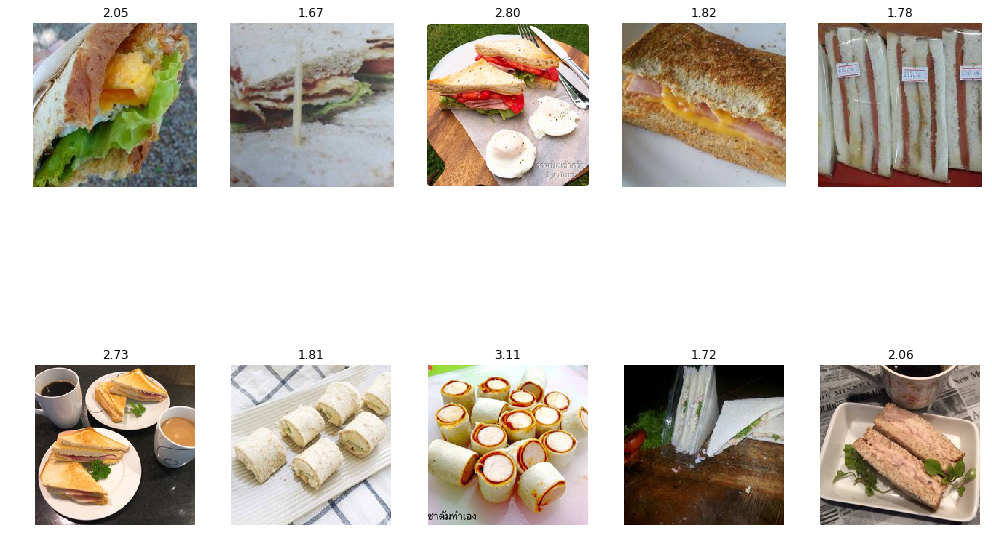

In [15]:
display_subfolder('sandwich')

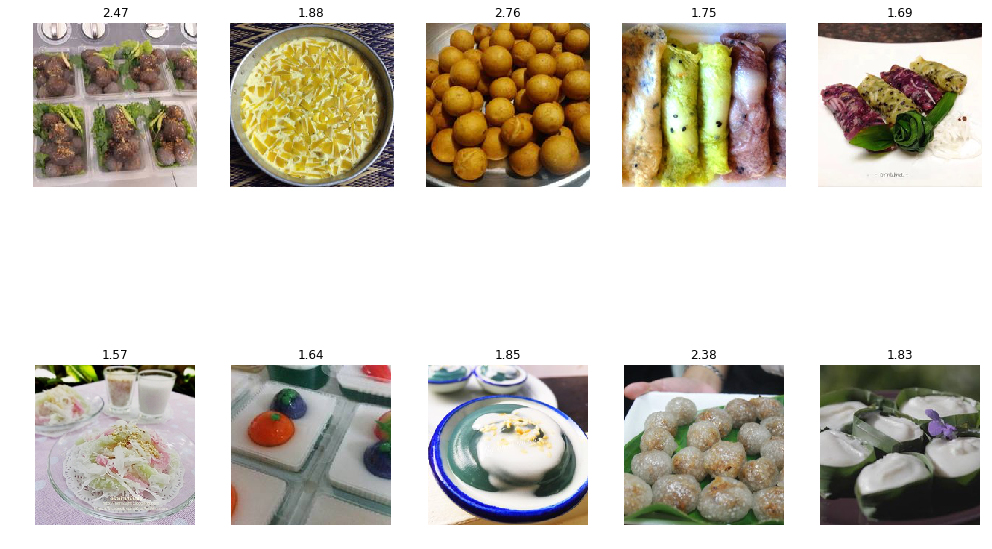

In [16]:
display_subfolder('Thai dessert top 10')

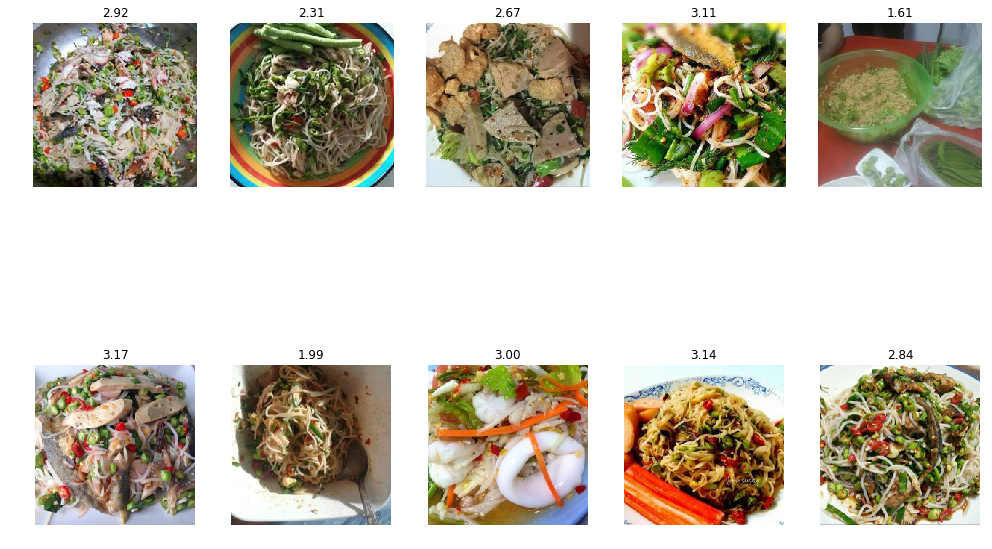

In [17]:
display_subfolder('Yum noodle top 10')

In [46]:
images = [fi for fi in os.listdir('/Users/oisin-brogan/Downloads/low UU/') if fi.endswith('.jpg')]

scores = []
for img in images:
    score = model.infer(Image.open('/Users/oisin-brogan/Downloads/low UU/'+ img))
    scores.append(score)

scores_dict['Bad'] = list(zip(images, scores))

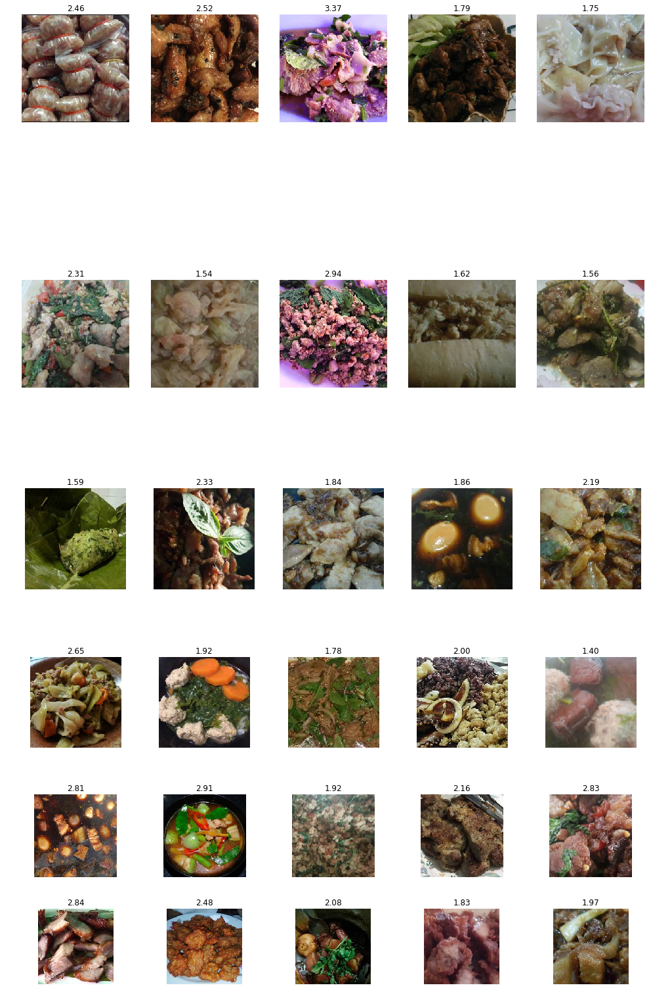

In [54]:
image_scores = scores_dict['Bad']

#display(HTML('{} score={:.2f}'.format(photo, score) ))
fig = plt.figure(figsize=(17, 30))
for index, img_score in enumerate(image_scores):
    img, score = img_score
    a=fig.add_subplot((index/5)+7, len(image_scores)/6, index + 1 + (5*int(index/5)))
    a.set_title('{:.2f}'.format(score))
    plt.imshow(Image.open('/Users/oisin-brogan/Downloads/low UU/'+img))
    plt.axis('off')
plt.show()
#   display(HTML('<hr>'))

In [56]:
print ("Average score of low UU photos: {}".format(pd.np.mean(scores)))

Average score of low UU photos: 2.1750478982925414


In [18]:
import pandas as pd

In [21]:
df = pd.DataFrame()
for sub_folder, img_scores in scores_dict.items():
    for img, score in img_scores:
        df = df.append(pd.Series([sub_folder, score], ['Type', 'Score']), ignore_index=True)

In [45]:
df.groupby('Type').mean()

,Score
Type,
Thai dessert top 10,1.982043
Yum noodle top 10,2.675518
banana,2.193703
chicken,2.818617
curry mushroom,2.246028
microwave,2.241680
pasta,2.619887
pork,2.621309
pork ribs,2.433249
